# Classificação para diferenciar as imagens de raio-x com uma e duas mãos.

Apenas as imagens de teste contém esta característica. As imagens de teste e treino parecem ter sido coletadas de fontes diferentes.

Utilizou-se o processamento das imagens de treino (com uma mão) para gerar, de forma aleatória, imagens com duas mãos.

As novas imagens geradas (com uma e duas mãos) são utilizadas para treinar uma CNN.

As imagens de teste não apresentam indicação se têm uma ou duas mãos, de forma que, foram analisadas, de forma amostral, por meio de inspeção visual.

O algoritmo aplicado sobre as imagens de teste quase não gera falsos positivos (identificar uma mão como sendo duas mãos) mas gera um considerável número de falsos negativos.

O critério "tamanho da imagem"utilizado por [Walxiney Galvão](https://www.kaggle.com/walxineygalvao) em https://www.kaggle.com/walxineygalvao/i2a2-rsna-bones-age-prediction-xception parece ser mais preciso e menos custoso que este algoritmo.


In [1]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import pandas as pd
from PIL import Image, ImageOps, ImageEnhance
import os
import random
import matplotlib.pyplot as plt
import keras
from keras.models import Model
from keras.layers import *
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
from keras.optimizers import Adam
from tqdm import tqdm
%matplotlib inline


Using TensorFlow backend.


In [2]:
img_path = '../input/i2a2-bone-age-regression/images/'

In [3]:
train_df = pd.read_csv('../input/i2a2-bone-age-regression/train.csv')
train_df.head()
print(train_df.shape)

(12611, 3)


In [4]:
#i = 0
#while i < 10:
    #im = Image.open(os.path.join(img_path,train_df['fileName'][random.randint(0, 12611)]))
    #plt.figure()
    #plt.imshow(im)
    #i = i+1

In [5]:
#img_format = []
#img_size = []
#for i in train_df['fileName']:
    #im = Image.open(os.path.join(img_path,i))
    #img_format.append(im.format)
    #img_size.append(im.size)
#print(len(img_size))
#train_df = train_df.join(pd.DataFrame({'img_format': img_format,'img_size': img_size}, index=train_df.index))
#train_df['img_format'] = img_format
#train_df['img_size'] =  img_size

In [6]:
#train_df.head()

In [7]:
one_two_hand = []
X = []
random.seed(29)
for i in tqdm(train_df['fileName']):
    im = Image.open(os.path.join(img_path,i)).convert('RGB')
    im = im.resize((256,256))
    im = im.crop((25,25,225,225))
    im = im.resize((256,256))
    im_enh = ImageEnhance.Contrast(im)
    im = im_enh.enhance(1)
    rand_onetwo = random.randint(0,1)     
    if rand_onetwo == 1:
        im_flip_v = ImageOps.mirror(im)
        imag = Image.new('RGB',(512,512), color=(100,100,100))
        imag.paste(im,(0,128,256,384))
        imag.paste(im_flip_v,(256,128,512,384))
        imag = imag.resize((256,256))
        if random.randint(0,1) == 1:
           imag = ImageOps.flip(imag)
        #plt.imshow(imag)
        #plt.show()
        imag_arr = np.asarray(imag)
        X.append(imag_arr)
        one_two_hand.append(0)
    else:
        im = im.resize((256,256))   
        if random.randint(0,1) == 1:
           im = ImageOps.flip(im) 
        #plt.imshow(im)
        #plt.show()
        im_arr = np.asarray(im)
        X.append(im_arr)
        one_two_hand.append(1)
X_t = np.stack(X,axis=0) 
y_t = np.asarray(one_two_hand)
print(X_t.shape, y_t.shape)

100%|██████████| 12611/12611 [04:16<00:00, 49.13it/s]


(12611, 256, 256, 3) (12611,)


In [8]:
X_t = np.stack(X,axis=0)
y_t = np.asarray(one_two_hand)

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X_t, y_t, test_size=0.33, random_state=42)

In [10]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [37]:
input_ = Input((256, 256,3))
x = input_
x = Conv2D(10, kernel_size = (3,3), strides = (1, 1), padding = 'same', activation = 'relu')(x)
x = Flatten()(x)
x = Dropout(0.1)(x)
x = Dense(1, activation  =  'sigmoid')(x)
model = Model(input_, x)
model.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 256, 256, 10)      280       
_________________________________________________________________
flatten_3 (Flatten)          (None, 655360)            0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 655360)            0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 655361    
Total params: 655,641
Trainable params: 655,641
Non-trainable params: 0
_________________________________________________________________


In [38]:
batch_size = 200
num_epochs = 20
learning_rate = 1e-6
model.compile(loss = 'binary_crossentropy', optimizer = Adam(lr = learning_rate), metrics = ['acc'])

In [39]:
history = model.fit(X_train, y_train,
          batch_size = batch_size,
          epochs = num_epochs,
          verbose = 1,
          validation_data = (X_test, y_test))

Train on 8449 samples, validate on 4162 samples
Epoch 1/20
8449/8449 [==============================] - 14s 2ms/step - loss: 4.3735 - acc: 0.8025 - val_loss: 0.2433 - val_acc: 0.9798
Epoch 2/20
8449/8449 [==============================] - 14s 2ms/step - loss: 0.4176 - acc: 0.9706 - val_loss: 0.1681 - val_acc: 0.9868
Epoch 3/20
8449/8449 [==============================] - 13s 2ms/step - loss: 0.2977 - acc: 0.9796 - val_loss: 0.1552 - val_acc: 0.9914
Epoch 4/20
8449/8449 [==============================] - 14s 2ms/step - loss: 0.2683 - acc: 0.9817 - val_loss: 0.1092 - val_acc: 0.9918
Epoch 5/20
8449/8449 [==============================] - 13s 2ms/step - loss: 0.2216 - acc: 0.9850 - val_loss: 0.0976 - val_acc: 0.9935
Epoch 6/20
8449/8449 [==============================] - 15s 2ms/step - loss: 0.1766 - acc: 0.9863 - val_loss: 0.0817 - val_acc: 0.9947
Epoch 7/20
8449/8449 [==============================] - 13s 2ms/step - loss: 0.1233 - acc: 0.9903 - val_loss: 0.0757 - val_acc: 0.9952
Epoch 8

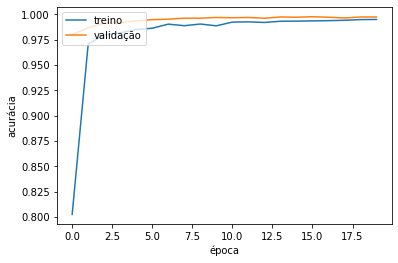

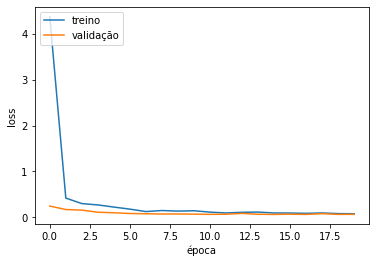

In [40]:
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.ylabel('acurácia')
plt.xlabel('época')
plt.legend(['treino', 'validação'], loc = 'upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.ylabel('loss')
plt.xlabel('época')
plt.legend(['treino', 'validação'], loc = 'upper left')
plt.show()

In [41]:
test_df = pd.read_csv('../input/i2a2-bone-age-regression/test.csv')
#test_df.head()
#print(test_df.shape)

In [42]:
X_teste = []
for i in test_df['fileName']:
    im_test = Image.open(os.path.join(img_path,i)).convert('RGB')
    im_test = im_test.resize((256,256))
    im_arr_test = np.array(im_test)
    X_teste.append(im_arr_test)
X_tteste = np.stack(X_teste,axis=0) 

In [43]:
resultado = model.predict(X_tteste)
#print(resultado)

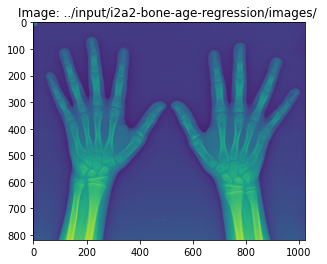

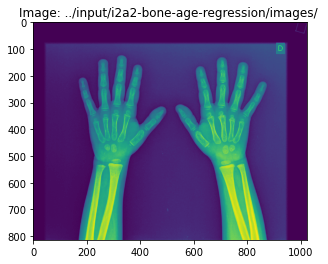

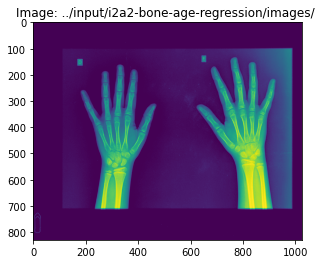

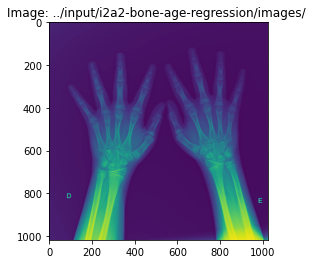

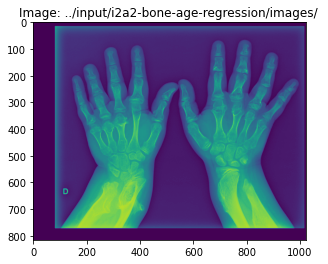

...

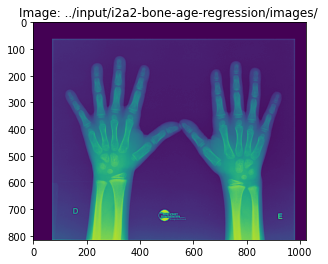

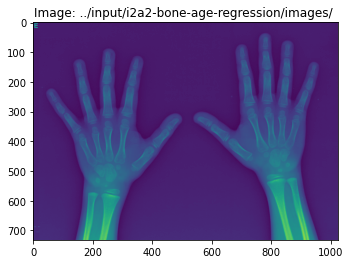

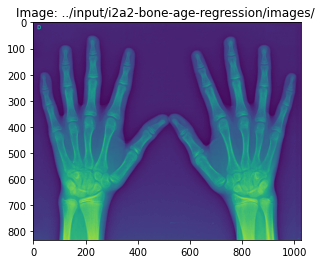

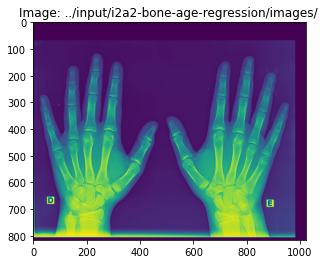

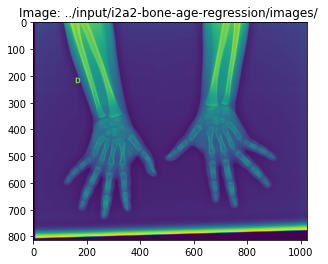

imagens classificadas com duas mãos 248


In [44]:
false_pos = 0
for i in range(0,len(resultado)):
    if resultado[i] != 1:
        #print(resultado[i])
        #print(test_df['fileName'][i])
        im = Image.open(os.path.join(img_path,test_df['fileName'][i]))
        w, h = im.size
        if w <= 800:
            false_pos += 1
        plt.title('Image: {} '.format(img_path,test_df['fileName'][i]))
        plt.imshow(im)
        plt.show()
print("imagens classificadas com duas mãos", i)

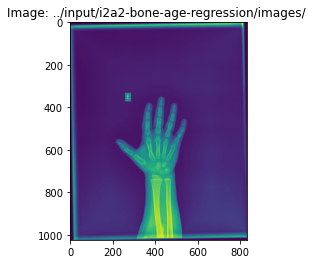

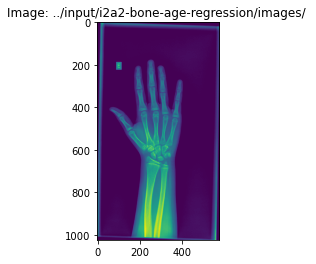

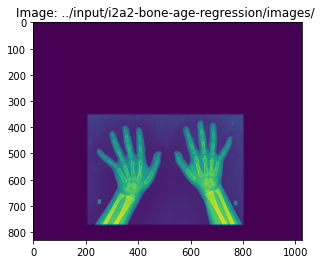

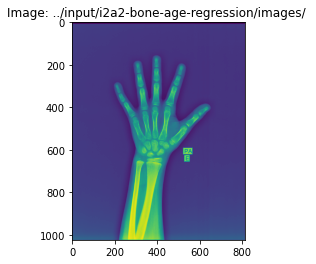

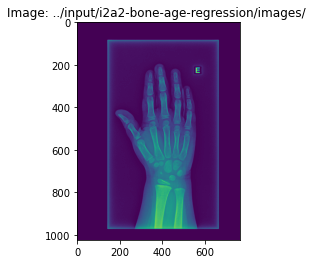

...

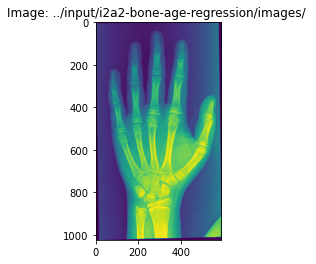

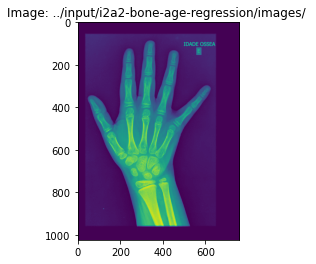

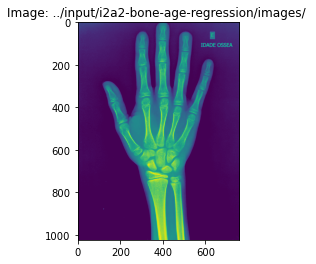

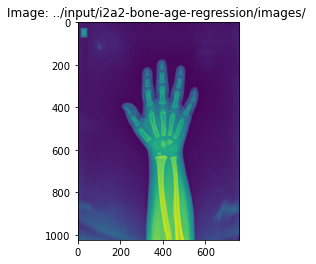

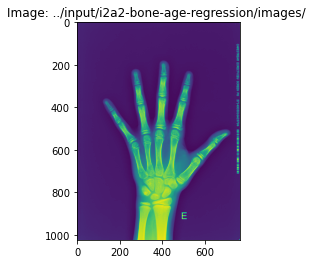

imagens classificadas com uma mão 248


In [45]:
false_neg = 0
for i in range(0,len(resultado)):
    if resultado[i] == 1:
        #print(resultado[i])
        #print(test_df['fileName'][i])
        im = Image.open(os.path.join(img_path,test_df['fileName'][i]))
        w, h = im.size
        if w > 800:
            false_neg += 1
        plt.title('Image: {} '.format(img_path,test_df['fileName'][i]))
        plt.imshow(im)
        plt.show()
print("imagens classificadas com uma mão", i)

In [46]:
print('false_positives', false_pos, 'false_negatives', false_neg)

false_positives 1 false_negatives 37
